# FB original tutorial

In [1]:
import pandas as pd
from fbprophet import Prophet

In [2]:
df = pd.read_csv('example_wp_log_peyton_manning.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2905 entries, 0 to 2904
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ds      2905 non-null   object 
 1   y       2905 non-null   float64
dtypes: float64(1), object(1)
memory usage: 45.5+ KB


In [4]:
df.tail()

,ds,y
2900,2016-01-16,7.817223
2901,2016-01-17,9.273878
2902,2016-01-18,10.333775
2903,2016-01-19,9.125871
2904,2016-01-20,8.891374


In [5]:
m = Prophet()
m.fit(df)

INFO:numexpr.utils:NumExpr defaulting to 4 threads.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [6]:
future = m.make_future_dataframe(periods = 365)
future.tail()

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


In [7]:
forecast = m.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,8.206497,7.493296,8.970323
3266,2017-01-16,8.531523,7.720124,9.227907
3267,2017-01-17,8.318930,7.599707,9.024663
3268,2017-01-18,8.151543,7.420752,8.845990
3269,2017-01-19,8.163477,7.397432,8.842104


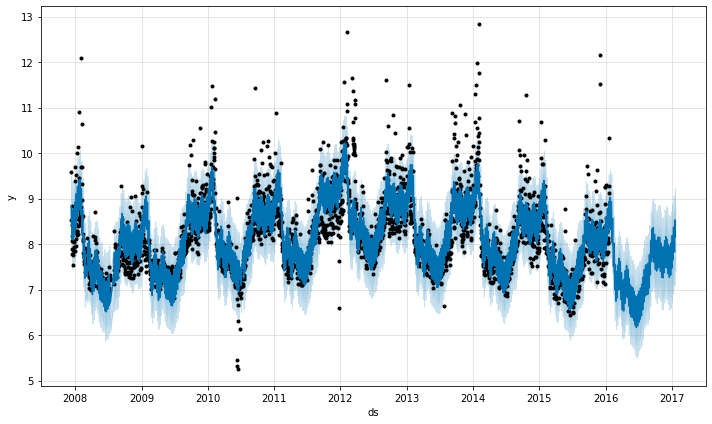

In [8]:
fig1 = m.plot(forecast)

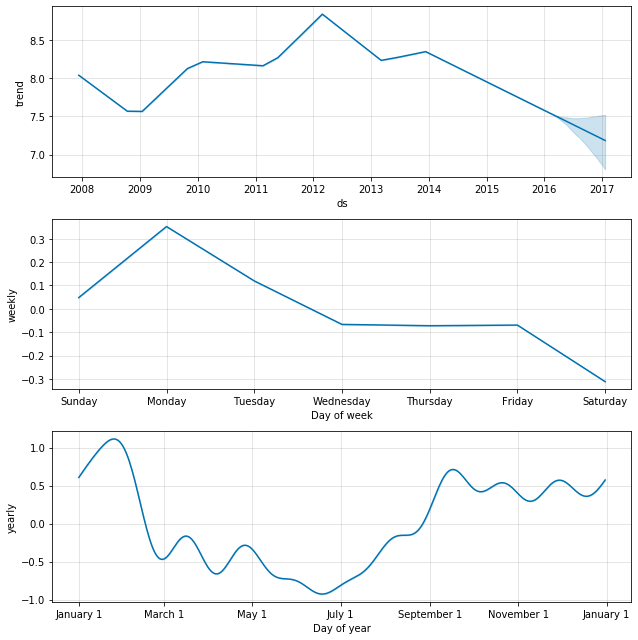

In [9]:
fig2 = m.plot_components(forecast)

In [10]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m,forecast)
py.iplot(fig)


In [11]:
# help(Prophet

# 2nd part Seasonality, Holiday Effects and Regressors

In [12]:
playoffs = pd.DataFrame({
    'holiday': 'playoff',
    'ds': pd.to_datetime(['2008-01-13', '2009-01-03', '2010-01-16',
                          '2010-01-24', '2010-02-07', '2011-01-08',
                          '2013-01-12', '2014-01-12', '2014-01-19',
                          '2014-02-02', '2015-01-11', '2016-01-17',
                          '2016-01-24', '2016-02-07']),
    'lower_window':0,
    'upper_window':1,
})
superbowls = pd.DataFrame({
    'holiday':'superbowl',
    'ds': pd.to_datetime(['2010-02-07', '2014-02-02','2016-02-07']),
    'lower_window':0,
    'upper_window':1,
})
holidays = pd.concat((playoffs, superbowls))

In [13]:
m = Prophet(holidays = holidays)
forecast = m.fit(df).predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [14]:
forecast[(forecast['playoff'] + forecast['superbowl']).abs()>0][
    ['ds','playoff','superbowl']][-10:]

,ds,playoff,superbowl
2190,2014-02-02,1.224174,1.197584
2191,2014-02-03,1.899740,1.459690
2532,2015-01-11,1.224174,0.000000
2533,2015-01-12,1.899740,0.000000
2901,2016-01-17,1.224174,0.000000
2902,2016-01-18,1.899740,0.000000
2908,2016-01-24,1.224174,0.000000
2909,2016-01-25,1.899740,0.000000
2922,2016-02-07,1.224174,1.197584
2923,2016-02-08,1.899740,1.459690


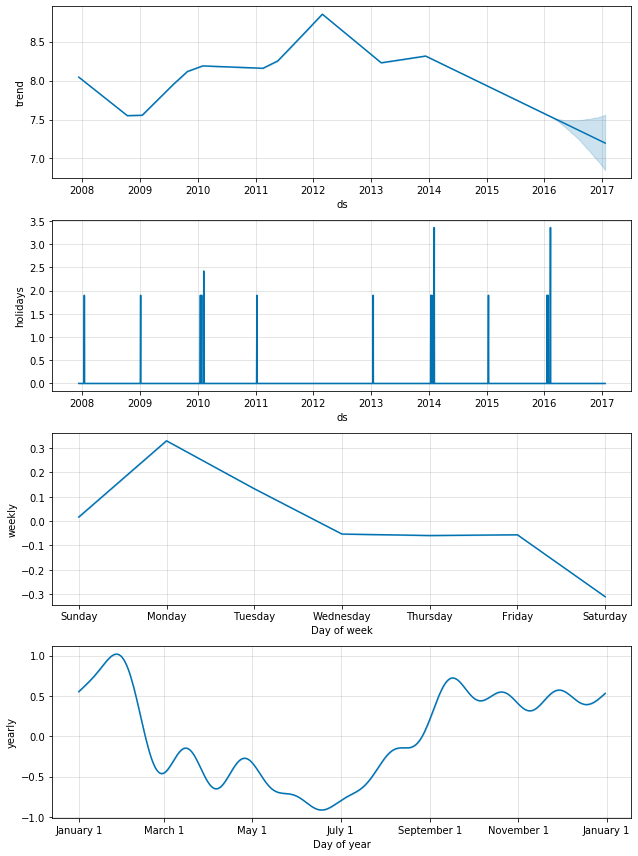

In [15]:
fig = m.plot_components(forecast)

In [16]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m,forecast)
py.iplot(fig)


# Built-in Conty Holidays

In [17]:
m = Prophet(holidays=holidays)
m.add_country_holidays(country_name='US')
m.fit(df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [18]:
m.train_holiday_names

0                         playoff
1                       superbowl
2                  New Year's Day
3      Martin Luther King Jr. Day
4           Washington's Birthday
5                    Memorial Day
6                Independence Day
7                       Labor Day
8                    Columbus Day
9                    Veterans Day
10                   Thanksgiving
11                  Christmas Day
12       Christmas Day (Observed)
13        Veterans Day (Observed)
14    Independence Day (Observed)
15      New Year's Day (Observed)
dtype: object

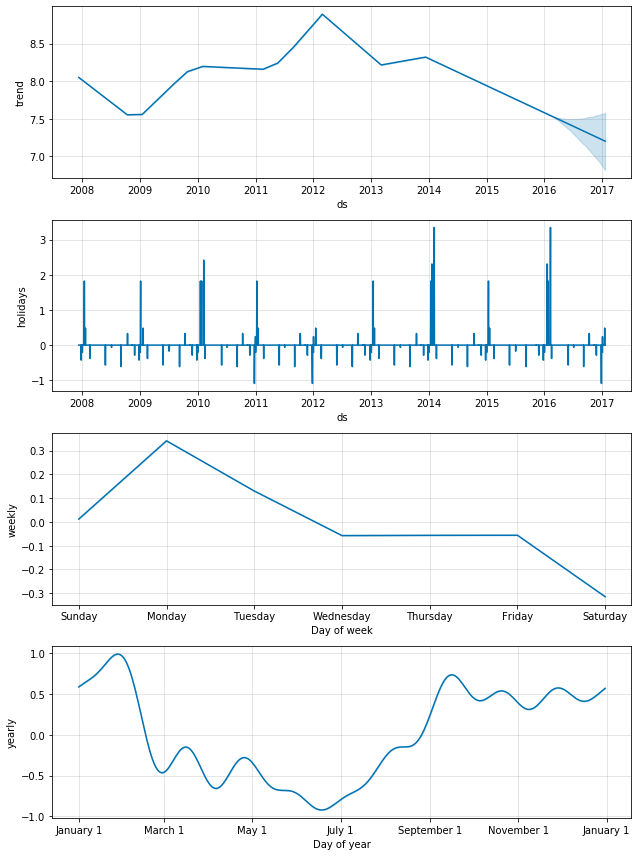

In [19]:
forecast = m.predict(future)
fig = m.plot_components(forecast)

In [20]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m,forecast)
py.iplot(fig)
